In [1]:
#Data Visualisation
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# load the dataset
df = pd.read_csv("weatherAUS.csv")

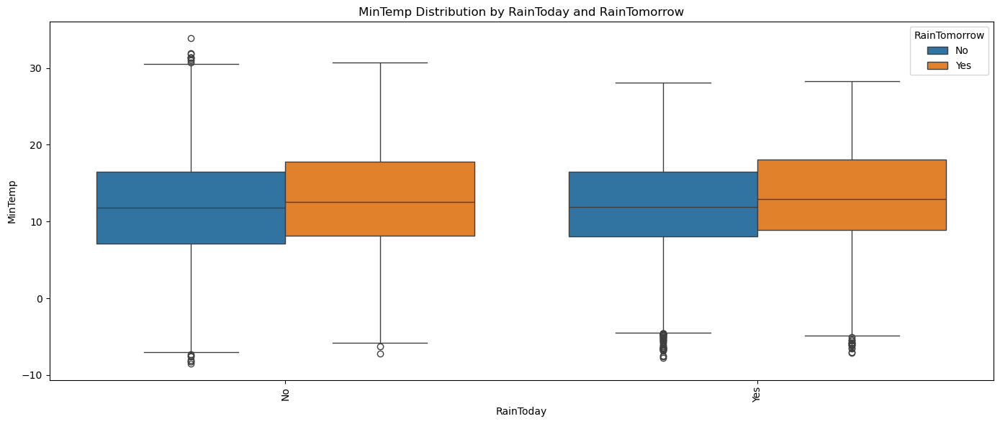

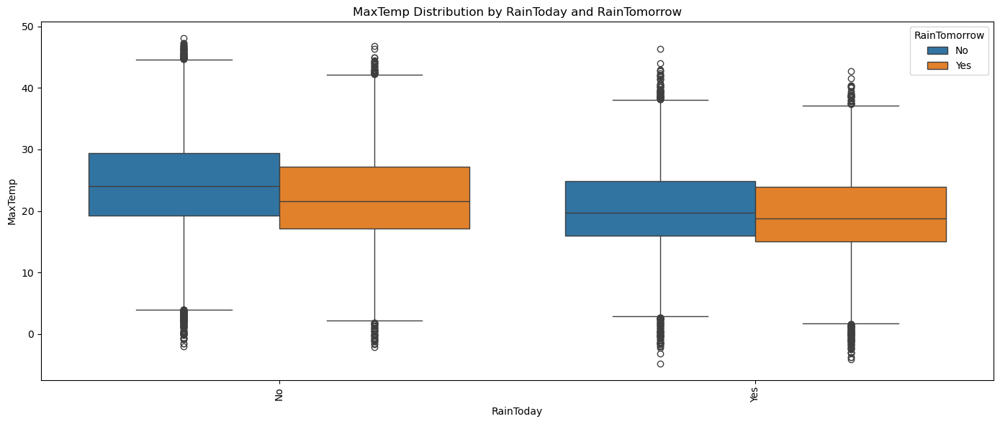

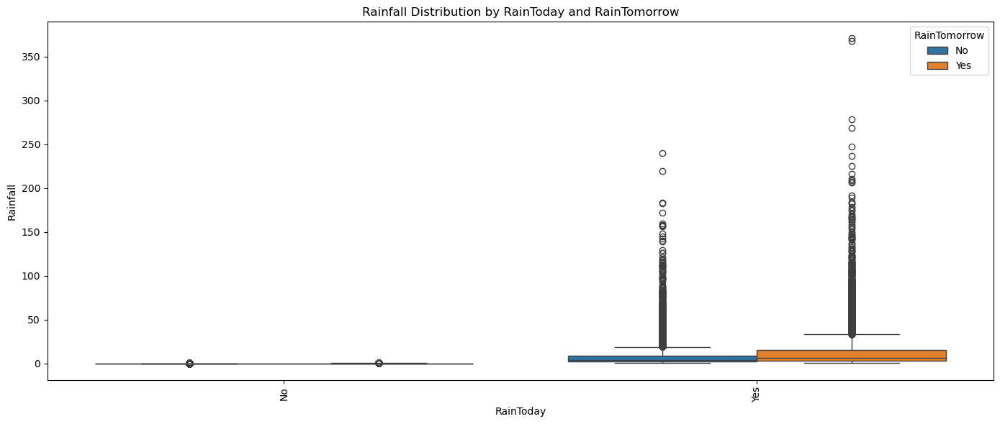

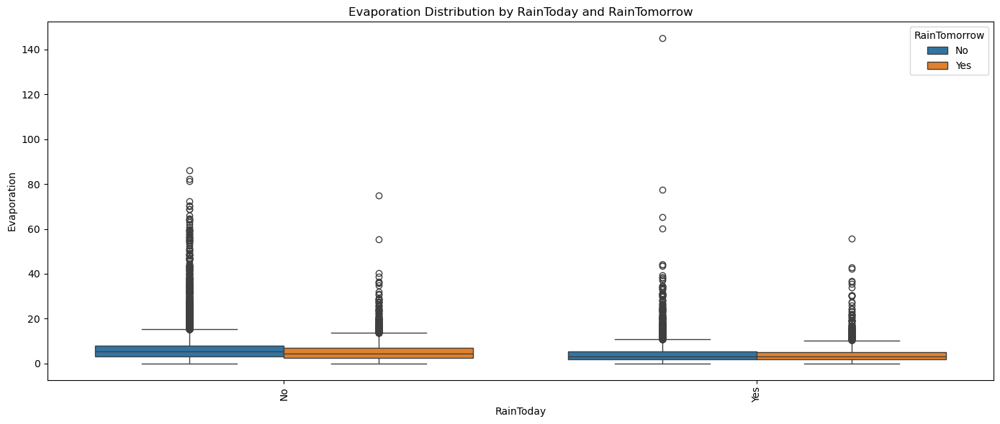

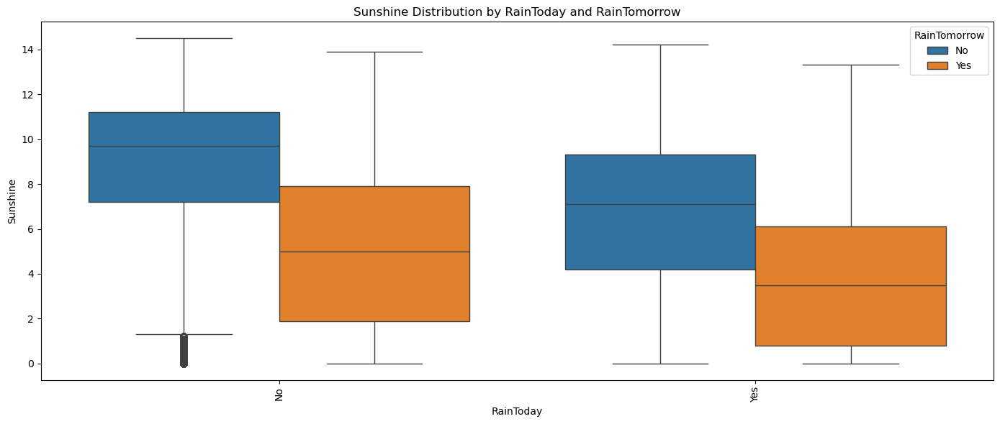

...

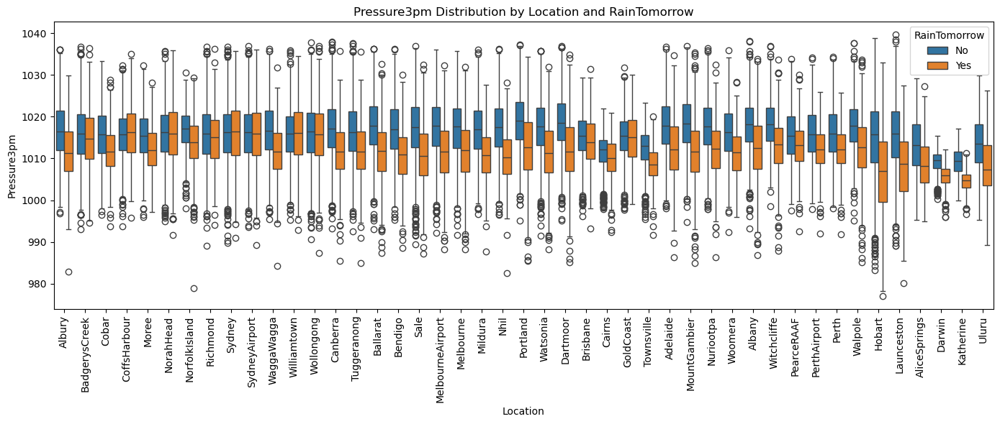

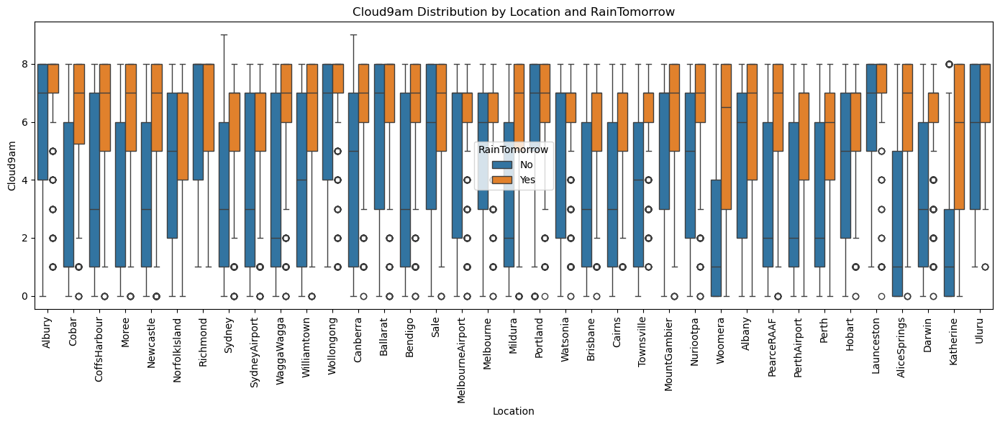

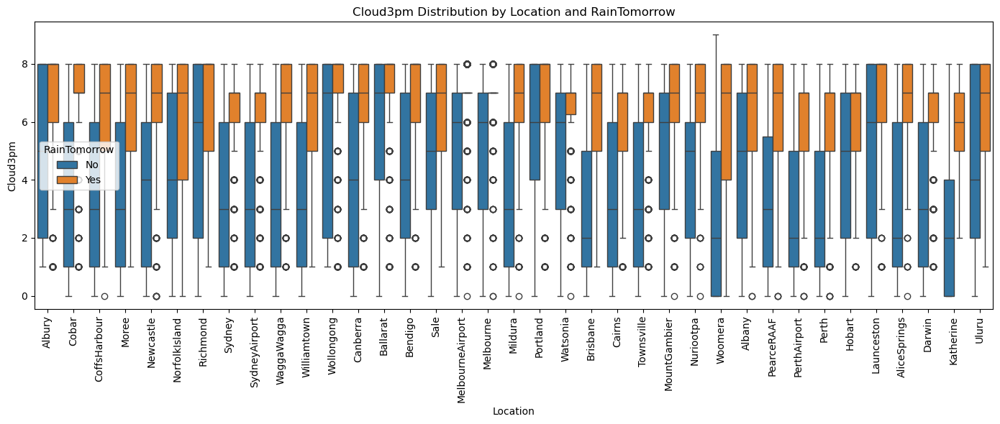

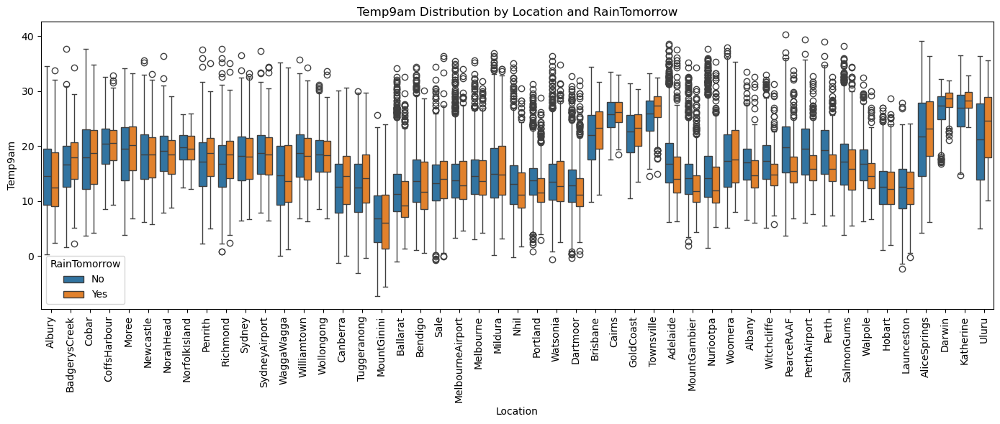

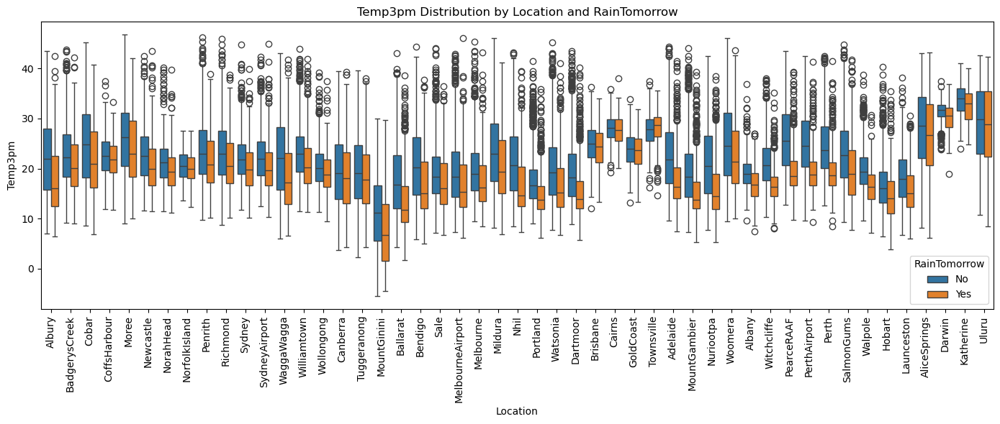

In [3]:
#Box Plot
# Define selected categorical features for grouping
selected_categorical = ['RainToday', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'Location']


# Get numerical columns
numerical_cols = df.select_dtypes(include='number').columns.tolist()

# Filter out rows with missing RainTomorrow values
df_filtered = df[df['RainTomorrow'].notnull()]

# Loop over selected categorical and all numerical features
for cat_col in selected_categorical:
    for num_col in numerical_cols:
        # Drop rows with missing values in the current pair of columns
        plot_data = df_filtered[[cat_col, num_col, 'RainTomorrow']].dropna()
        if plot_data.empty:
            continue

        # Create box plot
        plt.figure(figsize=(14, 6))
        sns.boxplot(x=cat_col, y=num_col, hue='RainTomorrow', data=plot_data)
        plt.title(f'{num_col} Distribution by {cat_col} and RainTomorrow')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.savefig("BoxPlot.png", dpi=300, bbox_inches='tight')
        plt.show()

In [4]:
# encode the rain today and rain tomorrow features using binary encoding
df['RainToday_binary'] = df['RainToday'].map({'No': 0, 'Yes': 1})
df['RainTomorrow_binary'] = df['RainTomorrow'].map({'No': 0, 'Yes': 1})

In [5]:
# samples of encoded vs non-encoded features
print("\n Sample of 'RainToday' Vs 'RainToday_binary':")
print(df[['RainToday', 'RainToday_binary']].head(2))
print("\n Sample of 'RainTomorrow' Vs 'RainTomorrow_binary':")
print(df[['RainTomorrow', 'RainTomorrow_binary']].head(2))


 Sample of 'RainToday' Vs 'RainToday_binary':
  RainToday  RainToday_binary
0        No               0.0
1        No               0.0

 Sample of 'RainTomorrow' Vs 'RainTomorrow_binary':
  RainTomorrow  RainTomorrow_binary
0           No                  0.0
1           No                  0.0


In [6]:
# encode the directional features such as 'WindGustDir', 'WindGustDir9am', and 'WindGustDir3pm' using cyclical encoding
def cyclical_encode(series):
#directions to degrees mapping
    dirsToDegrees = {
        'N': 0, 'NNE': 22.5, 'NE': 45, 'ENE': 67.5,
        'E': 90, 'ESE': 112.5, 'SE': 135, 'SSE': 157.5,
        'S': 180, 'SSW': 202.5, 'SW': 225, 'WSW': 247.5,
        'W': 270, 'WNW': 292.5, 'NW': 315, 'NNW': 337.5
    }
    #convert degrees to radians to apply sin and cosine calculations
    rads = series.map(dirsToDegrees).fillna(0) * np.pi / 180
    return np.sin(rads), np.cos(rads)

for columns in ['WindGustDir', 'WindDir9am', 'WindDir3pm']:
    df[f'{columns}_sin'], df[f'{columns}_cos'] = cyclical_encode(df[columns])

In [7]:
# samples of encoded Vs non-encoded features
print("\n Sample of 'WindGustDir' Vs 'WindGustDir_sin' and 'WindGustDir_cos':")
print(df[['WindGustDir', 'WindGustDir_sin', 'WindGustDir_cos']].head(3))

print("\n Sample of 'WindDir9am' Vs 'WindDir9am_sin' and 'WindDir9am_cos':")
print(df[['WindDir9am', 'WindDir9am_sin', 'WindDir9am_cos']].head(3))

print("\n Sample of 'WindDir3pm' Vs 'WindDir3pm_sin' and 'WindDir3pm_cos':")
print(df[['WindDir3pm', 'WindDir3pm_sin', 'WindDir3pm_cos']].head(3))


 Sample of 'WindGustDir' Vs 'WindGustDir_sin' and 'WindGustDir_cos':
  WindGustDir  WindGustDir_sin  WindGustDir_cos
0           W         -1.00000    -1.836970e-16
1         WNW         -0.92388     3.826834e-01
2         WSW         -0.92388    -3.826834e-01

 Sample of 'WindDir9am' Vs 'WindDir9am_sin' and 'WindDir9am_cos':
  WindDir9am  WindDir9am_sin  WindDir9am_cos
0          W       -1.000000   -1.836970e-16
1        NNW       -0.382683    9.238795e-01
2          W       -1.000000   -1.836970e-16

 Sample of 'WindDir3pm' Vs 'WindDir3pm_sin' and 'WindDir3pm_cos':
  WindDir3pm  WindDir3pm_sin  WindDir3pm_cos
0        WNW        -0.92388        0.382683
1        WSW        -0.92388       -0.382683
2        WSW        -0.92388       -0.382683


In [8]:
# encode the location feature using one-hot encoding
df = pd.get_dummies(df, columns=['Location'], prefix='Loca_')

In [9]:
print("\n sample features that result from one-hot encoding the feature 'Location':")
location_columns = [col for col in df.columns if col.startswith("Loca_")]
# Convert all one-hot encoded boolean features to binary values (0/1) instead of 'True' 'False'
df[location_columns] = df[location_columns].astype(int)
print(df[location_columns].head(3))


 sample features that result from one-hot encoding the feature 'Location':
   Loca__Adelaide  Loca__Albany  Loca__Albury  Loca__AliceSprings  \
0               0             0             1                   0   
1               0             0             1                   0   
2               0             0             1                   0   

   Loca__BadgerysCreek  Loca__Ballarat  Loca__Bendigo  Loca__Brisbane  \
0                    0               0              0               0   
1                    0               0              0               0   
2                    0               0              0               0   

   Loca__Cairns  Loca__Canberra  ...  Loca__Townsville  Loca__Tuggeranong  \
0             0               0  ...                 0                  0   
1             0               0  ...                 0                  0   
2             0               0  ...                 0                  0   

   Loca__Uluru  Loca__WaggaWagga  Loca__Walpo

In [10]:
# preparing the data (after encoding all to numeric)
df_encoded = df.select_dtypes(include=[np.number])

In [11]:
# Correlation matrix
corre_matx = df_encoded.corr()

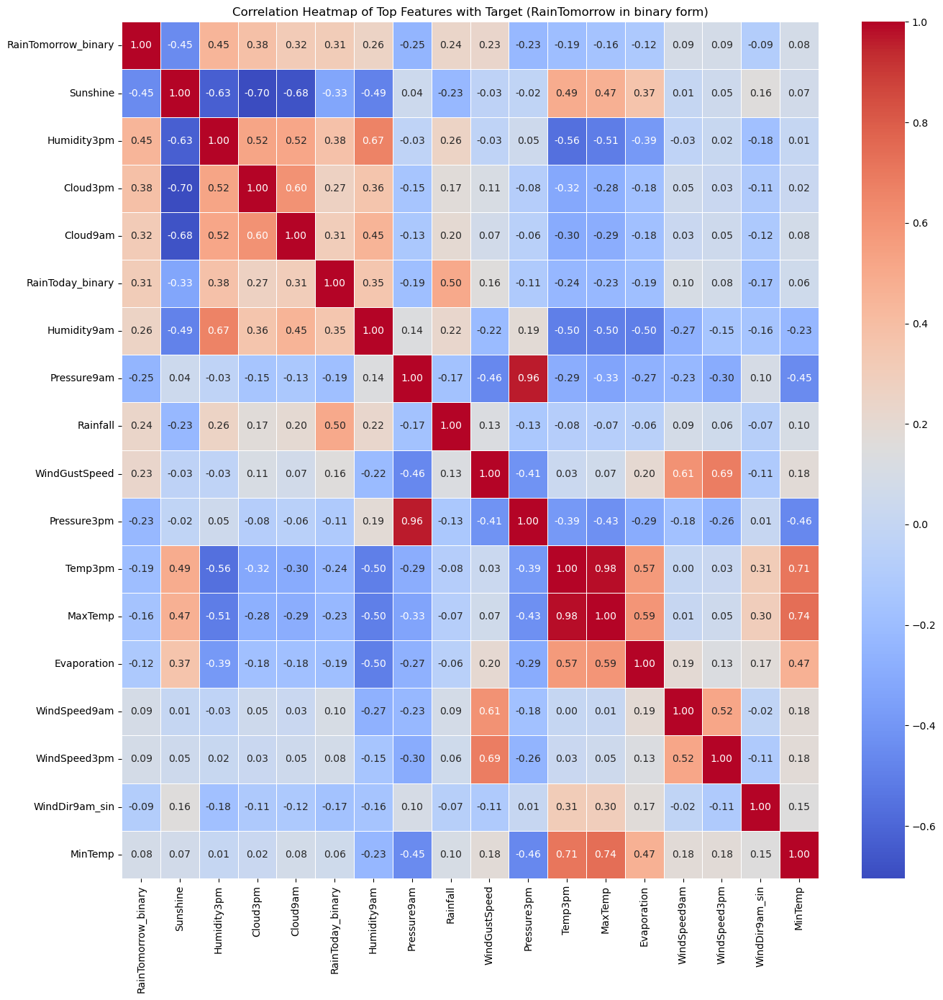

In [12]:
# Select the top correlated features with the target variable 'RainTommorow'
top_correlations = corre_matx['RainTomorrow_binary'].abs().sort_values(ascending=False).head(18).index

# plot and display heatmap
plt.figure(figsize=(14, 14))
sns.heatmap(df_encoded[top_correlations].corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Correlation Heatmap of Top Features with Target (RainTomorrow in binary form)")
plt.tight_layout()
#print the heatmap to file to use in the report
plt.savefig("CorrelationHeatmap.png", dpi=300, bbox_inches='tight')
plt.show()


<Figure size 1200x1000 with 0 Axes>

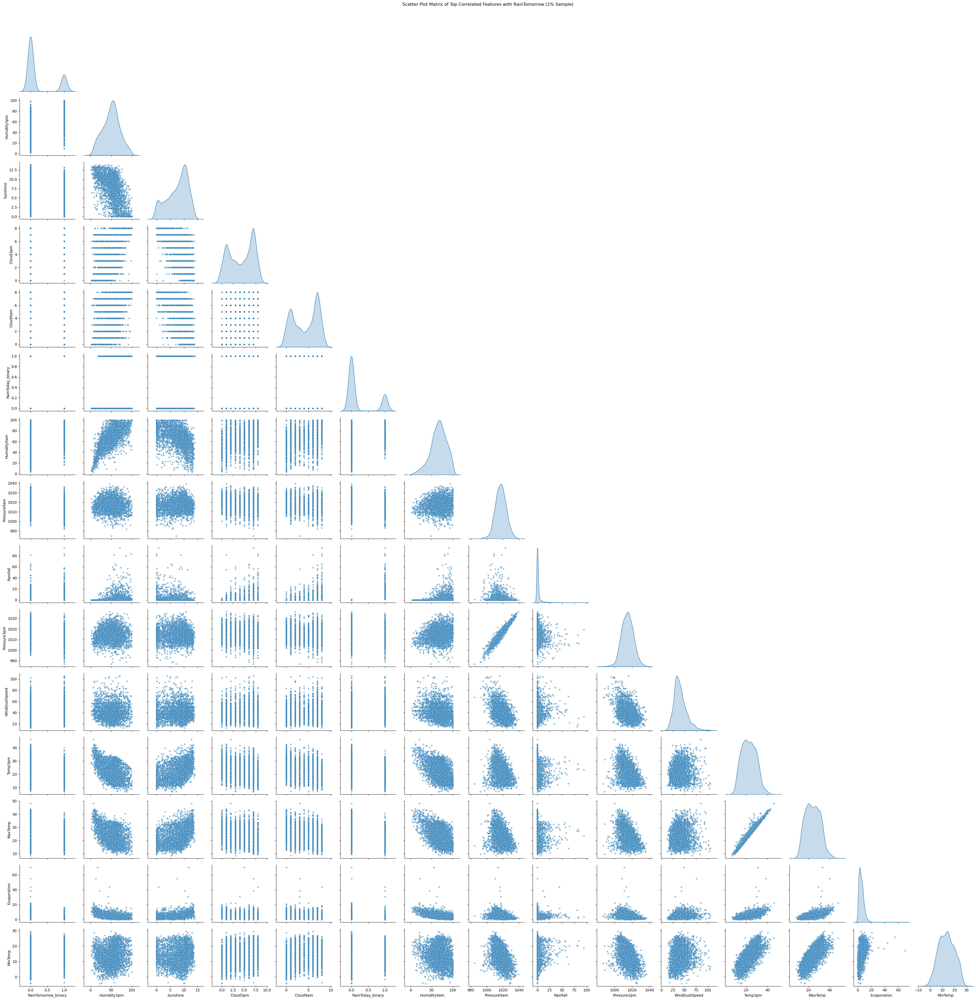

In [13]:
# 4. Keep only numerical data
df_encoded = df.select_dtypes(include=[np.number])

# Optional: drop NaNs if still present
df_encoded = df_encoded.dropna()

# Drop columns with names that include 'WindDir' or start with 'Location'
cols_to_exclude = [col for col in df_encoded.columns if 'WindGustDir' in col or 'Loca_' in col or 'WindDir' in col]
df_filtered = df_encoded.drop(columns=cols_to_exclude)

# 5. Get top correlated features with RainTomorrow_binary
cor_matrix = df_filtered.corr()
organized_corr_matrix = cor_matrix['RainTomorrow_binary'].abs().sort_values(ascending=False).head(15).index

# 6. Sample the data (e.g., 10% of rows)
sampled = df_encoded[organized_corr_matrix].sample(frac=0.05, random_state=42)

# 7. Create scatter plot matrix (pair plot)
plt.figure(figsize=(12, 10))
sns.pairplot(sampled, corner=True, diag_kind='kde', plot_kws={'alpha': 0.5, 's': 20})
plt.suptitle("Scatter Plot Matrix of Top Correlated Features with RainTomorrow (1% Sample)", y=1.02)
plt.tight_layout()
plt.savefig("ScatterPlotMatrix_Sampled.png", dpi=300, bbox_inches='tight')
plt.show()